In [1]:
import torch
import sys
import os
from torchvision import datasets, transforms
from pathlib import Path
import matplotlib.pyplot as plt

In [2]:
IN_COLAB = 'google.colab' in sys.modules

In [3]:
if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    proj_folder = "/content/drive/MyDrive/machine_learning/FYPTinyDiffusion/diffusion_winnet"

In [4]:
if IN_COLAB:
    sys.path.append(proj_folder)
    # sys.path.append(f"{proj_folder}/pytorch_fid")
    # sys.path.append(f"{proj_folder}/ema_pytorch")

In [5]:
from diffusion.denoising_diffusion_pytorch import GaussianDiffusion, Trainer
from models.lifting_denoiser import LiftingDenoiser

In [6]:
def sigmoid_beta_schedule(
    timesteps,
    start = -3,
    end = 3,
    tau = 1,
    clamp_min = 1e-5
):
    """
    sigmoid schedule
    proposed in https://arxiv.org/abs/2212.11972 - Figure 8
    better for images > 64x64, when used during training
    """
    steps = timesteps + 1
    t = torch.linspace(0, timesteps, steps, dtype = torch.float64) / timesteps
    v_start = torch.tensor(start / tau).sigmoid()
    v_end = torch.tensor(end / tau).sigmoid()
    alphas_cumprod = (-((t * (end - start) + start) / tau).sigmoid() + v_end) / (v_end - v_start)
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0, 0.999)

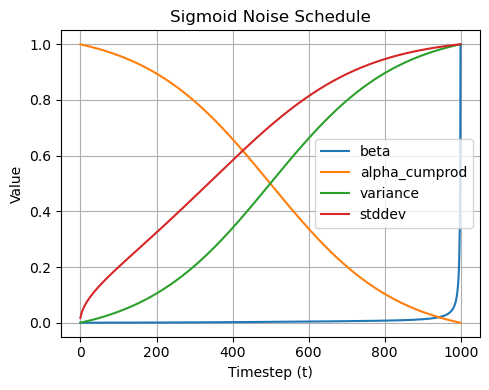

In [7]:
T_STEPS = 1000

timesteps = torch.arange(0, T_STEPS)
betas = sigmoid_beta_schedule(T_STEPS)
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, dim=0)
variance = 1. - alphas_cumprod
sigmas = torch.sqrt(variance)

plt.figure(figsize=(5, 4))
plt.plot(timesteps.numpy(), betas.numpy(), label="beta")
plt.plot(timesteps.numpy(), alphas_cumprod.numpy(), label="alpha_cumprod")
plt.plot(timesteps.numpy(), variance.numpy(), label="variance")
plt.plot(timesteps.numpy(), sigmas.numpy(), label="stddev")
plt.legend()
plt.xlabel("Timestep (t)")
plt.ylabel(r"Value")
plt.title("Sigmoid Noise Schedule")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [8]:
sigmas.shape

torch.Size([1000])

In [9]:
MODEL_NAME = "lifting_denoiser"
IMAGES_PATH = './fashion_images'
TINY_DIFFUSION_DIR = "/content/drive/MyDrive/machine_learning/FYPTinyDiffusion"

RESULTS_FOLDER = f'{TINY_DIFFUSION_DIR}/results/fashionmnist_diffusion/{MODEL_NAME}'

In [10]:
init_params = {
    "LiftingDenoiser": {
        "input_channels": 1,
        "coarse_channels": 3,
        "hidden_channels": 128,
        "num_lifting_steps": 4,
        "lifting_type": "revnet",
        "detail_denoiser": "clista",
        "split_merge_type": "haar_redundant",
        "do_convert_t_to_sigma": True,
        "num_haar_scales": 4,
    },
    "GaussianDiffusion": {
        "image_size": 32, # 28 for raw Fashion-MNIST, 32 after padding/resize
        "timesteps": 1000, # forward diffusion steps
        "sampling_timesteps": 50, # DDIM steps at inference
        "objective": "pred_x0" # or 'pred_noise'
    },
    "Trainer": {
        "folder": IMAGES_PATH,
        "results_folder": RESULTS_FOLDER,
        "train_batch_size": 128,
        "train_lr": 1e-4,
        "train_num_steps": 100_000,
        "ema_update_every": 10,
        "save_and_sample_every": 20_000,
        "num_samples": 100,
        "calculate_fid": True,
        "amp": True,
        "save_best_and_latest_only": True,
    },
}

In [11]:
model = LiftingDenoiser(**init_params["LiftingDenoiser"])

Updated sigma values successfully.
first 10 sigma values:
tensor([0.0173, 0.0245, 0.0301, 0.0348, 0.0390, 0.0427, 0.0462, 0.0495, 0.0526,
        0.0555], dtype=torch.float64)


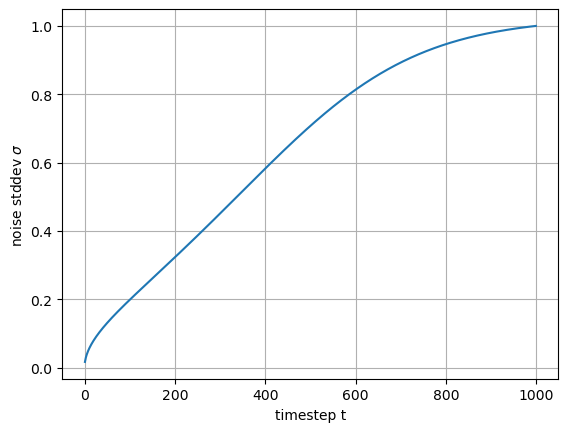

In [12]:
if hasattr(model, "update_sigmas_t"):
    model.update_sigmas_t(sigmas, "Updated sigma values successfully.")

    print(f"first 10 sigma values:\n{model.sigmas[:10]}")
    plt.plot(model.sigmas)
    plt.grid()
    plt.xlabel("timestep t")
    plt.ylabel(r"noise stddev $\sigma$")
    plt.show()

In [13]:
diffusion = GaussianDiffusion(model, **init_params["GaussianDiffusion"])

In [14]:
param_count = sum(p.numel() for p in model.parameters())
param_count

1492448

In [15]:
model

LiftingDenoiser(
  (split_merge): MultiScaleStationaryHaar()
  (lifting_steps): ModuleList(
    (0-3): 4 x RevNetLiftingPair(
      (f): Conditioner(
        (b1): ConvFiLMBlock(
          (conv): Conv2d(10, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (gn): GroupNorm(8, 128, eps=1e-05, affine=False)
          (film): FiLM(
            (mlp): Sequential(
              (0): Linear(in_features=1, out_features=32, bias=True)
              (1): ReLU(inplace=True)
              (2): Linear(in_features=32, out_features=256, bias=True)
            )
          )
        )
        (b2): ConvFiLMBlock(
          (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (gn): GroupNorm(8, 128, eps=1e-05, affine=False)
          (film): FiLM(
            (mlp): Sequential(
              (0): Linear(in_features=1, out_features=32, bias=True)
              (1): ReLU(inplace=True)
              (2): Linear(in_features=32, out_features=256, bias=True)
 

## Retrieve the Dataset

In [ ]:
# FashionMNIST Dataset

# root      = './data'
# save_root = Path('./fashion_images')
# save_root.mkdir(parents=True, exist_ok=True)

# fm_train = datasets.FashionMNIST(
#     root, train=True, download=True, transform=transforms.ToTensor()
# )
# for idx, (tensor, _) in enumerate(fm_train):
#     # convert 0-1 tensor → PIL L and (optionally) pad to 32×32
#     img = transforms.ToPILImage(mode='L')(tensor)
#     img = transforms.Resize(32, antialias=True)(img)   # keep square, upsample
#     img.save(save_root / f'{idx:06}.png')

In [ ]:
# CIFAR10 Dataset

root      = './data'
save_root = Path('./cifar_images')
save_root.mkdir(parents=True, exist_ok=True)

cifar_train = datasets.CIFAR10(root, train=True, download=True)
for idx, (img, _) in enumerate(cifar_train):
    img.save(save_root / f'{idx:06}.png')   # already 32×32 RGB

100%|██████████| 170M/170M [00:06<00:00, 24.6MB/s]


In [ ]:
trainer = Trainer(
    diffusion,
    **init_params["Trainer"]
)

Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 130MB/s]


In [ ]:
trainer.train()

  0%|          | 0/200000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

Stacking Inception features for 50000 samples from the real dataset.


  0%|          | 0/391 [00:00<?, ?it/s]

Dataset stats cached to /content/drive/My Drive/machine_learning/FYPTinyDiffusion/results/small_unet/dataset_stats.npz for future use.
Stacking Inception features for 50000 generated samples.


  0%|          | 0/391 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

fid_score: 242.57563285783394


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

Stacking Inception features for 50000 generated samples.


  0%|          | 0/391 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

fid_score: 233.44158828281786


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

Stacking Inception features for 50000 generated samples.


  0%|          | 0/391 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

fid_score: 235.09133201315484


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

Stacking Inception features for 50000 generated samples.


  0%|          | 0/391 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

fid_score: 231.64151316512954
training complete


loss: 0.0784

fid_score: 231.6415

In [ ]:
from google.colab import runtime
runtime.unassign()

## Saving the Model

In [ ]:
from datetime import datetime
import json

In [ ]:
results_folder = "drive/MyDrive/machine_learning/FYPTinyDiffusion/results"

In [ ]:
current_datetime = datetime.now()
formatted_datetime = current_datetime.strftime("%d%b_%H%M")

In [ ]:
json_filename = f"init_params_{formatted_datetime}.json"
json_filename = f"{results_folder}/{json_filename}"

model_filename = f"diffusion_model_{formatted_datetime}.pt"
model_path = f"{results_folder}/{model_filename}"

In [ ]:
# save the init params
with open(json_filename, "w") as f:
    json.dump(init_params, f)

print(f"Init params saved to {json_filename}")

# save the model
torch.save(diffusion.state_dict(), model_path)
print(f"Model saved to {model_path}")

In [ ]:
# load the model
init_params = json.load(open(json_filename, "r"))

model = Unet(**init_params["Unet"])
diffusion = GaussianDiffusion(model, **init_params["GaussianDiffusion"])

In [ ]:
diffusion.load_state_dict(torch.load(model_path, weights_only=True))

<All keys matched successfully>

In [ ]:
trainer = Trainer(
    diffusion,
    **init_params["Trainer"]
)

In [ ]:
import torchvision.utils as vutils
import math

In [ ]:
def split_into_groups(total: int, group_size: int):
    """
    Break *total* samples into a list of subgroup sizes.

    Example
    -------
    >>> split_into_groups(10, 4)  # → [4, 4, 2]
    """
    full_groups, remainder = divmod(total, group_size)
    sizes = [group_size] * full_groups
    if remainder:
        sizes.append(remainder)
    return sizes

In [ ]:
num_samples = 100
trainer.ema.ema_model.eval()

with torch.inference_mode():
    milestone = "end_of_training"
    batches = split_into_groups(num_samples, trainer.batch_size)
    all_images_list = list(map(
        lambda n: trainer.ema.ema_model.sample(batch_size=n),
        batches))

all_images = torch.cat(all_images_list, dim=0)

vutils.save_image(
    all_images,
    str(trainer.results_folder / f'sample-{milestone}.png'),
    nrow=int(math.sqrt(num_samples))
)

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
from google.colab import runtime
runtime.unassign()